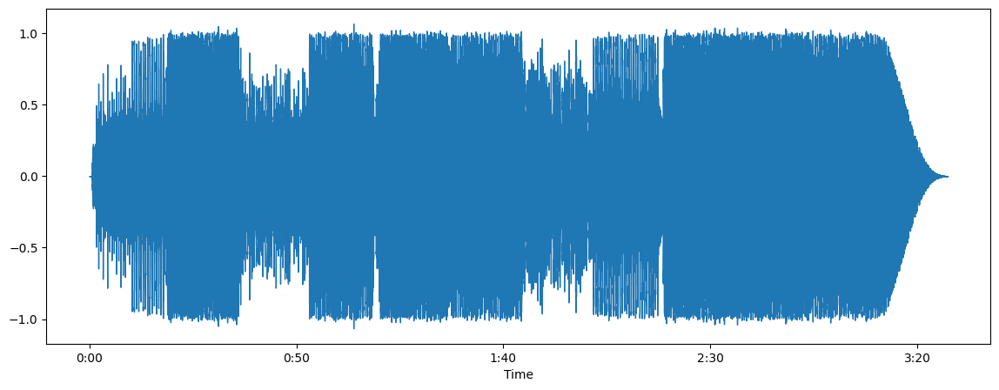

In [1]:
import os
import matplotlib.pyplot as plt

import librosa
import librosa.display

import IPython.display as ipd

file = 'musics\Три дня дождя - Отпускай.mp3'
format = file.split('.')[-1]
y, sr = librosa.load(file)
# y, sr = librosa.load(file, duration=20)
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr)
plt.get('Monophonic')

plt.show()

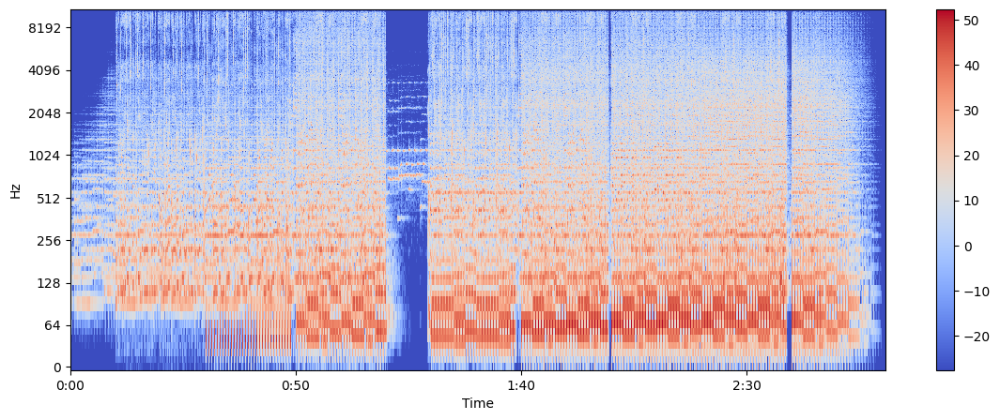

In [2]:
X = librosa.stft(y)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
# librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
# plt.colorbar()
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

In [3]:
with open(file, 'rb') as f:
    md = f.read(5)
md

b'ID3\x03\x00'

In [11]:
if format == 'flac' or format == 'aiff':
    import librosa
    y, sr = librosa.load(file, sr=44100)

    display(ipd.Audio(y, rate=sr))
else:
    import IPython.display as ipd
    display(ipd.Audio(file))

In [11]:
from mutagen import File
audio = File(file)
print("Все данные:")
for key, value in audio.items():
    print(key, ':', value)

Все данные:
TIT2 : Отпускай
TPE1 : Три дня дождя
TPE2 : Три дня дождя
TALB : Отпускай
TCON : rusrock
TRCK : 1
APIC: : APIC(encoding=<Encoding.LATIN1: 0>, mime='image/jpeg', type=<PictureType.COVER_FRONT: 3>, desc='', data=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x05\x03\x04\x04\x04\x03\x05\x04\x04\x04\x05\x05\x05\x06\x07\x0c\x08\x07\x07\x07\x07\x0f\x0b\x0b\t\x0c\x11\x0f\x12\x12\x11\x0f\x11\x11\x13\x16\x1c\x17\x13\x14\x1a\x15\x11\x11\x18!\x18\x1a\x1d\x1d\x1f\x1f\x1f\x13\x17"$"\x1e$\x1c\x1e\x1f\x1e\xff\xdb\x00C\x01\x05\x05\x05\x07\x06\x07\x0e\x08\x08\x0e\x1e\x14\x11\x14\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\xff\xc0\x00\x11\x08\x01\x90\x01\x90\x03\x01\x11\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1c\x00\x00\x02\x02\x03\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x06\x0

In [2]:
# mp3
import eyed3
from mutagen import File

# audiofile = eyed3.load("music.mp3")
# audiofile.tag.artist = "Token Entry"
# audiofile.tag.album = "Free For All Comp LP"
# audiofile.tag.album_artist = "Various Artists"
# audiofile.tag.title = "The Edge"
# audiofile.tag.track_num = 3
# audiofile.tag.save()
if format == 'mp3':
    name = eyed3.load(file)
    audio = File(file)

    if name.tag.title:
        title = name.tag.title
        print('Название песни:', title)
    else:
        print('Название песни не найдено')
        
    if name.tag.artist:
        artist = name.tag.artist
        print('Исполнитель:', artist)
    else:
        print('Исполнитель не найден')
        
    if name.tag.album:
        album = name.tag.album
        print('Альбом:', album)
    else:
        print('Альбом не найден')
    if name.tag.track_num[0]:
        number = name.tag.track_num[0]
        print('Номер трека:', number)
    else:
        print('Номер трека не найден')
    if name.tag.disc_num[0]:
        number_d = name.tag.disc_num[0]
        print('Номер диска:', number_d)
    else:
        print('Номер диска не найден')
    if name.tag.genre:
        genre = name.tag.genre.name
        print('Жанр:', genre)
    else:
        print('Жанр не найден')
    if name.tag.getBestDate():
        date = name.tag.getBestDate()
        print('Дата релиза:', date)
    else:
        print('Дата не найдена')
    if name.tag.composer:
        composer  = name.tag.composer
        print('Композиторы:', composer )
    else:
        print('Композитор не найден')
    if name.tag.album_type:
        album_type  = name.tag.album_type
        print('Тип альбома:', album_type )
    else:
        print('Тип альбома не найден')

    y, sr = librosa.load(file)

    duration = librosa.get_duration(y=y, sr=sr)
    tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr)

    print('Длительность аудиофайла:', duration)
    print('Темп музыки:', tempo)

    if 'APIC:' in audio.tags:
        picture = audio.tags['APIC:'].data
        with open(f'covers/album_cover_{title}.jpg', 'wb') as f:
            f.write(picture)
        print('Обложка альбома сохранена в файл album_cover.jpg')
    else:
        print('Обложка альбома не найдена')

    if 'USLT:' in audio.tags:
        lyrics = audio.tags['USLT:'].text
        recognizer = sr.Recognizer()
        text = recognizer.recognize_sphinx(lyrics)
        print('Текст песни:', text)
    else:
        print('Текст песни не найден')

Non standard genre name: rusrock
Non standard genre name: rusrock


Название песни: Отпускай
Исполнитель: Три дня дождя
Альбом: Отпускай
Номер трека: 1
Номер диска не найден
Жанр: rusrock
Дата релиза: 2022
Композитор не найден
Тип альбома не найден
Длительность аудиофайла: 207.36
Темп музыки: 112.34714673913044
Обложка альбома сохранена в файл album_cover.jpg
Текст песни не найден


In [12]:
# flac
from mutagen import File
if format =='flac':
    audio = File(file)

    # Извлечение метаданных
    if 'title' in audio:
        title = audio['title'][0]
        print('Название песни:', title)
    else:
        print('Название песни не найдено')
        
    if 'artist' in audio:
        artist = audio['artist'][0]
        print('Исполнитель:', artist)
    else:
        print('Исполнитель не найден')
        
    if 'album' in audio:
        album = audio['album'][0]
        print('Альбом:', album)
    else:
        print('Альбом не найден')
    if 'composer' in audio:
        composer  = audio['composer'][0]
        print('Композиторы:', composer )
    else:
        print('Композитор не найден')
    if 'tracknumber' in audio:
        number = audio['tracknumber'][0]
        print('Номер трека:', number)
    else:
        print('Номер трека не найден')
    if 'discnumber' in audio:
        number_d = audio['discnumber'][0]
        print('Номер диска:', number_d)
    else:
        print('Номер диска не найден')
    if 'author' in audio:
        author = audio['author']
        print('Авторы:', author)
    else:
        print('Автор не найден')
    if 'genre' in audio:
        genre = audio['genre']
        print('Жанр:', genre)
    else:
        print('Жанр не найден')
    if 'date' in audio:
        date = audio['date'][0]
        print('Дата релиза:', date)
    else:
        print('Дата не найдена')
    duration = audio.info.length
    print('Длительность аудиофайла:', duration, 'секунд')

    # Получение обложки альбома
    if 'APIC:' in audio.tags:
        picture = audio.tags['APIC:'].data
        with open(f'covers/album_cover_{title}.jpg', 'wb') as f:
            f.write(picture)
        print('Обложка альбома сохранена в файл album_cover.jpg')
    else:
        print('Обложка альбома не найдена')

    if 'USLT:' in audio.tags:
        lyrics = audio.tags['USLT:'].text
        recognizer = sr.Recognizer()
        text = recognizer.recognize_sphinx(lyrics)
        print('Текст песни:', text)
    else:
        print('Текст песни не найден')


Название песни: Дом
Исполнитель: NABOKOVA
Альбом: Кувшинки
Композиторы: Михайлова Дарья Валерьевна
Номер трека: 3
Номер диска: 1
Авторы: ['Михайлова Дарья Валерьевна', 'Сериков Артём Артурович', 'Павлов Никита Дмитриевич']
Жанр: ['Alternative', 'Indie Pop', 'Indie Rock']
Дата релиза: 2023-01-30
Длительность аудиофайла: 139.37498866213153 секунд
Обложка альбома не найдена
Текст песни не найден


In [14]:
# wav

# import wave
# with wave.open(file, 'r') as wav_file:
#     print("Number of channels:", wav_file.getnchannels())
#     print("Sample width:", wav_file.getsampwidth())
#     print("Frame rate:", wav_file.getframerate())
#     print("Number of frames:", wav_file.getnframes())
#     print("Compression type:", wav_file.getcompname())
#     frames = wav_file.getnframes()
#     rate = wav_file.getframerate()
#     duration = frames / float(rate)
#     print("Duration:", duration, "seconds")

import wave
if format == 'wav':
    w = wave.open(file, 'r')

    # from mutagen.wavpack import WavPack

    # wav_file = WavPack('musics/music.wav')
    # print("Название песни:", wav_file['title'][0])

    import tinytag

    audio = tinytag.TinyTag.get(file)

    if audio.title:
        print("Название песни:", audio.title)
    else:
        print("Название песни не найдено")
    if audio.artist:
        print("Исполнитель:", audio.artist)
    else:
        print("Исполнитель не найден")
    if audio.album: 
        print("Альбом:", audio.album)
    else:
        print("Альбом не найден")
    if audio.genre:
        print("Жанр:", audio.genre)
    else:
        print("Жанр не найден")
    if audio.year:
        print("Год выпуска:", audio.year)
    else:
        print("Год выпуска не найден")
    if audio.track:
        print("Номер трека:", audio.track)
    else:
        print("Номер трека не найден")

    # параметры аудиофайла
    if w.getparams():
        print("Параметры аудиофайла:", w.getparams())
    else:
        print("Параметры не найдены")   
    # количество фреймов
    if w.getnframes():
        print("Количество фреймов:", w.getnframes())
    else:
        print("Количество фреймов не найдено")     
    # частота дискретизации
    if w.getframerate():
        print("Частота дискретизации:", w.getframerate())
    else:
        print("Частота дискретизации не найдена")     
    # количество каналов
    if w.getnchannels():
        print("Количество каналов:", w.getnchannels())
    else:
        print("Количество каналов не найдено")     
    # битность
    if w.getsampwidth():
        print("Битность:", w.getsampwidth())
    else:
        print("Битность не найдена")     
    # продолжительность аудиофайла в секундах
    duration = w.getnframes() / float(w.getframerate())
    print("Продолжительность аудиофайла:", round(duration, 2), "секунд")

    # данные о каждом фрейме аудиофайла
    # frames = audio.readframes(file.getnframes())
    # print("Данные о каждом фрейме аудиофайла:", frames)

    w.close()

Название песни: Thirty Seconds Over Winterland (1973) 1
Исполнитель: Jefferson Airplane
Альбом не найден
Жанр не найден
Год выпуска не найден
Номер трека не найден
Параметры аудиофайла: _wave_params(nchannels=2, sampwidth=2, framerate=44100, nframes=51882870, comptype='NONE', compname='not compressed')
Количество фреймов: 51882870
Частота дискретизации: 44100
Количество каналов: 2
Битность: 2
Продолжительность аудиофайла: 1176.48 секунд


In [16]:
# aiff
from mutagen import File
if format == 'aiff':
    audio = File(file)

    # Извлечение метаданных
    if 'TALB' in audio:
        album = audio['TALB']
        print('Альбом:', album)
    else:
        print('Альбом не найден')
    if 'TBPM' in audio:
        temp = audio['TBPM']
        print('Темп:', temp)
    else:
        print('Темп не найден')
    if 'TCON' in audio:
        genre = audio['TCON']
        print('Жанр:', genre)
    else:
        print('Жанр не найден')
    if 'TDOR' in audio:
        date = audio['TDOR']
        print('Дата релиза:', date)
    else:
        print('Дата не найдена')
    if 'TENC' in audio:
        code = audio['TENC']
        print('Кодировка:', code)
    else:
        print('Кодировка не найдена')
    if 'TFLT' in audio:
        format = audio['TFLT']
        print('Формат:', format)
    else:
        print('Формат не найден')
    if 'TIT1' in audio:
        groupe = audio['TIT1']
        print('Группа:', groupe)
    else:
        print('Группа не найдена')
    if 'TIT2' in audio:
        title = audio['TIT2']
        print('Название песни:', title)
    else:
        print('Название песни не найдено')    
    if 'TPE1' in audio:
        artist = audio['TPE1']
        print('Исполнитель:', artist)
    else:
        print('Исполнитель не найден')
    if 'TPUB' in audio:
        izd = audio['TPUB']
        print('Издательство:', izd)
    else:
        print('Издательство не найден')
    if 'TRCK' in audio:
        number = audio['TRCK']
        print('Номер трека:', number)
    else:
        print('Номер трека не найден')
    duration = audio.info.length
    print('Длительность аудиофайла:', duration, 'секунд')

    # Получение обложки альбома
    if 'APIC:' in audio.tags:
        picture = audio.tags['APIC:'].data
        with open(f'covers/album_cover_{title}.jpg', 'wb') as f:
            f.write(picture)
        print('Обложка альбома сохранена в файл album_cover.jpg')
    else:
        print('Обложка альбома не найдена')

    if 'USLT:' in audio.tags:
        lyrics = audio.tags['USLT:'].text
        recognizer = sr.Recognizer()
        text = recognizer.recognize_sphinx(lyrics)
        print('Текст песни:', text)
    else:
        print('Текст песни не найден')

Альбом: Livin' 4 Ya
Темп: 126
Жанр: Future House
Дата релиза: 2016-12-02
Кодировка: Beatport
Формат: AIFF
Группа: HEXAGON
Название песни: Livin' 4 Ya feat. Katt Niall (Extended Mix)
Исполнитель: Katt Niall, MOTi
Издательство: HEXAGON
Номер трека: 1
Длительность аудиофайла: 264.76190476190476 секунд
Обложка альбома сохранена в файл album_cover.jpg
Текст песни не найден
